# Data analysis

In [95]:
from pathlib import Path
import pandas as pd
from ydata_profiling import ProfileReport
from summarytools import dfSummary
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from statsmodels.tsa.seasonal import seasonal_decompose
from ipywidgets import interact
from hyperopt import hp, tpe, fmin, Trials
import statsmodels.api as sm
from hyperopt.pyll import scope
from sklearn.metrics import mean_absolute_error, mean_squared_error, mean_absolute_percentage_error
from statsmodels.tsa.ardl import ARDL
import xgboost as xgb

from mlflow.tracking import MlflowClient
import mlflow

mlflow.set_tracking_uri(uri="http://127.0.0.1:5000")
%matplotlib inline

In [2]:
df = pd.read_csv('data.csv')
df.head()

,Store,Dept,Date,Weekly_Sales,IsHoliday,Temperature,Fuel_Price,Meta1,Meta2,Meta3,Meta4,Meta5,CPI,Unemployment,Type,Size
0,26,92,2011-08-26,87235.57,False,61.10,3.796,NaN,NaN,NaN,NaN,NaN,136.213613,7.767,A,152513
1,34,22,2011-03-25,5945.97,False,53.11,3.480,NaN,NaN,NaN,NaN,NaN,128.616064,10.398,A,158114
2,21,28,2010-12-03,1219.89,False,50.43,2.708,NaN,NaN,NaN,NaN,NaN,211.265543,8.163,B,140167
3,8,9,2010-09-17,11972.71,False,75.32,2.582,NaN,NaN,NaN,NaN,NaN,214.878556,6.315,A,155078
4,19,55,2012-05-18,8271.82,False,58.81,4.029,12613.98,NaN,11.5,1705.28,3600.79,138.106581,8.150,A,203819


In [3]:
dfSummary(df)

No,Variable,Stats / Values,Freqs / (% of Valid),Graph,Missing
1,Store[int64],Mean (sd) : 22.2 (12.8)min < med < max:1.0 < 22.0 < 45.0IQR (CV) : 22.0 (1.7),45 distinct values,"<img src = ""data:image/png;base64, iVBORw0KGgoAAAANSUhEUgAAAKoAAABGCAYAAABc8A97AAAAOXRFWHRTb2Z0d2FyZQBNYXRwbG90bGliIHZlcnNpb24zLjcuNCwgaHR0cHM6Ly9tYXRwbG90bGliLm9yZy8WgzjOAAAACXBIWXMAAA9hAAAPYQGoP6dpAAACeUlEQVR4nO3dP47aQBiH4W/CsjIg2eKPoOMCK6VAouEAKXPYHCEFRWpuQIeEkBHOWhjjdJFSZBfbGM8PvU8/zAi/Hs9aSOuKojDAd1/aXgBwi5e2F/AR51zPzF4rDj8XRfF+z/WgPd6G6pzrjcfj72EYDquMPx6PB+fcjzZi5Qa7P29DNbPXMAyHq9XqPYqitMzAOI6D9Xo93O/3r2b20IuufIP57NNQ294doihKp9Pp7wpDe3XmrUHyBvPdh6GyO1QneIN57bMdld0BXrjpjMrugLbxHhUSCBUSCBUSCBUSfH7hjwrafu/dFEJ9Is/83ptQn8vTvvcm1CfU1nvvJo8dhPofNb708Hq9du+9Ht81fexoNNQ8z7tmFjrnqgyvdcFrzh2MRqNvURQNyg7MsizI8/wtTdOfZlZlV1PV6LGjsVCTJOlmWfZ1Pp93Op1OqYWb1bvg95jbzN6Wy+WvyWRyLDN2u90ON5tN/3K5dMrO+wyaOnY0Fur5fH4JgqC/WCzS2Wx2KDu+zgW/19xBEGRlv/TD4VDrnNfmU8hnjZ9RB4NBpTus7gVve+4q2nwK+Y4/pjzS5lPId4TqIbUnwSMQKv7y+XxMqDAz/8/HhAoz8/98TKj4h6/nY36PCgmECgmECgmECgmECgmECgmECgmECgmECgmECgmECgmECgmECgmECgmECgmECgmECgmECgmECgmECgmECgmECgmECgmECgmECgmECgmECgmECgmECgmECgmECgmECgmECgmECgmECgmECgmECgmECgmECgmECgmECgk3/ee+OI6Dsh98Op0CM7MkSYLdbtd/5HjVuVXXXXf8LX39AQDvpKQwExhuAAAAAElFTkSuQmCC"">",0(0.0%)
2,Dept[int64],Mean (sd) : 44.3 (30.5)min < med < max:1.0 < 38.0 < 99.0IQR (CV) : 56.0 (1.5),81 distinct values,"<img src = ""data:image/png;base64, iVBORw0KGgoAAAANSUhEUgAAAKoAAABGCAYAAABc8A97AAAAOXRFWHRTb2Z0d2FyZQBNYXRwbG90bGliIHZlcnNpb24zLjcuNCwgaHR0cHM6Ly9tYXRwbG90bGliLm9yZy8WgzjOAAAACXBIWXMAAA9hAAAPYQGoP6dpAAACmklEQVR4nO3dQYriQBSA4VeTVqJCggi68wIDs3DpIeawc4RZeAJv4E6QEDHdwRgzm+lmoLU1VdZYL/zfupPO4tdYlSpimqYRIHTfnn0BwD1ebv2BMWYgIn3L8x+bpnmzPBb48GWoxpjBZDL5mSTJ2Obk+/0+M8b8Ila4uvWN2k+SZLxcLt/SNC3bnDjP83i1Wo13u11fRAgVTm7e+kVE0jQtp9Ppq8X5BxbHAJ8wmIIKhAoVCBUq3PUb9VmYGsO7YENlagz/CjZUYWpMHZ93wJBDFRGmxrTwfQf0Gmpd1z0RSYwxNocn5/O59+BLgj9e74DeQi2KoldV1Y/5fB5FUdTqwkVEqqqK67r+XpblbxGx+UbFE/i6A3oL9Xg8vsRxPFwsFuVsNsvaHr/ZbMbr9Xp4Op0iH9cHXbz/Rh2NRlafsCzL+I2JD0z4Q4XgR/22HAdyIjwwCEonQ3UdyInwwCA0nQzVdSDHA4PwdDLUd7YDub8YzAWEwRRUIFSoQKhQgVChAqFCBUKFCoQKFQgVKnR6wh/tOG4l8brQnVA90Lh71nUrie+F7oT6YIp3z1pvJRHxv9CdUB9P9e5Z260kvhe6E6on7J59LEK9wmHhNbtnPSDUC1wWXrN71g9CvcBl4TW7Z/0g1C/YLLxm96wfPJmCCoQKFQgVKhAqVGAw1TEO6wyCnv8l1A5xWWcQ+vwvoXaL9TqD0Od/CbWDbNYZhD7/y2AKKhAqVCBUqECoUIFQoQKhQgVChQqEChUIFSrwZCowvJbzMkINCK/lvI5QA8JrOa8j1ADxWs7PGExBBUKFCoQKFQgVKhAqVCBUqECoUIFQoQKhQoW7nkzleR63PfHhcIhFRIqiiLfb7fB/Hq/1f2u9btfj7+nrDxo7su0a1hHEAAAAAElFTkSuQmCC"">",0(0.0%)
3,Date[object],1. 2010-09-242. 2011-12-233. 2012-02-104. 2012-02-175. 2012-06-086. 2011-06-177. 2011-08-198. 2011-12-099. 2011-12-1610. 2012-09-1411. other,"2,044 (0.7%)2,043 (0.7%)2,040 (0.7%)2,040 (0.7%)2,032 (0.7%)2,031 (0.7%)2,030 (0.7%)2,026 (0.7%)2,025 (0.7%)2,022 (0.7%)262,118 (92.8%)","<img src = ""data:image/png;base64, iVBORw0KGgoAAAANSUhEUgAAAJsAAAD+CAYAAAAtWHdlAAAAOXRFWHRTb2Z0d2FyZQBNYXRwbG90bGliIHZlcnNpb24zLjcuNCwgaHR0cHM6Ly9tYXRwbG90bGliLm9yZy8WgzjOAAAACXBIWXMAAA9hAAAPYQGoP6dpAAADe0lEQVR4nO3cMW4aUQBF0Y+FrLgZhJBYDIvwYrMIdoMQU8SWG1IE14FEvijknCpFiimuhsnXf1mcz+cBhad7PwD/D7GRERsZsZERGxmxkREbGbGRERuZxRjjZYwxzufz252fhQe33Gw2r2OMsVgsvguOr/Q0TdN6mqb1GOP53g/DY/PNRkZsZMRGRmxkxEZGbGTERkZsZMRGRmxkxEZGbGTERkZsZMRGRmxklvM8Hy9//rjrk/DwbBDILPyXWVS82chYV5GxriLj6IOM2MiIjYzYyIiNjNjIiI2M2MiIjYzYyIiNjNjIiI2M2MiIjYzBCxnXwskYvJDxZiNj8ELG4IWMow8yYiMjNjJiIyM2MmIjIzYyYiMjNjJiIyM2MmIjIzYyYiMjNjIGL2RcCydj8ELGNxsZP6NkrKvIWFeR8c1GRmxkxEZGbGTERkZsZMRGRmxkxEZGbGTERkZsZMRGRmxkxEbGuoqMa+FkrKvIeLORMXghY/BCxtEHGbGRERsZsZERGxmxkREbGbGRERsZsZERGxmxkREbGbGRERsZgxcyroWTMXgh481GxuCFjMELGUcfZMRGRmxkxEZGbGTERkZsZMRGRmxkxEZGbGTERkZsZMRGRmxkxEbGuoqMDQIZ6yoy3mxkrKvIWFeRcfRBRmxkxEZGbGTERkZsZMRGRmxkxEZGbGTERkZsZMRGRmxkxEbG4IWMa+FkDF7IeLORMXghY/BCxtEHGbGRERsZsZERGxmxkREbGbGRERsZsZERGxmxkREbGbGRERsZgxcyroWTMXgh45uNjJ9RMtZVZKyryPhmIyM2MmIjIzYyYiMjNjJiIyM2MmIjIzYyYiMjNjJiIyM2MmIjY11FxrVwMtZVZLzZyBi8kDF4IePog4zYyIiNjNjIiI2M2MiIjYzYyIiNjNjIiI2M2MiIjYzYyIiNjMELGdfCyRi8kPl8s7kSzp/6uPZXcbnZbF4vGwS42TzPx2vHUstp


Interpreting Sales Dataset Columns:
Here's a breakdown of the columns in your sales dataset:

Identification:

- Store: Identifies the store where the sale occurred.
- Dept: Identifies the department within the store where the sale happened.
- Date: Date of the sale (likely in a specific format like DD/MM/YYYY).

Sale Information:

- Weekly_Sales: Total sales for the week associated with the date.
- IsHoliday: Boolean flag indicating whether the date is a holiday.

External Factors:

- Temperature: Average temperature on the date of the sale.
- Fuel_Price: Average fuel price at the time of the sale.
- CPI: Consumer Price Index, reflecting the general cost of living at the time.
- Unemployment: Unemployment rate at the time of the sale.

Product Information:

- Type: The category or type of the product sold.
- Size: The size or dimension of the product.

Meta Information:

- Meta1-5: These can be additional product-specific attributes or even custom-defined features for analysis

Here we use pandas profiling to assist with common EDA tasks and interactive analysis.

In [4]:
profile = ProfileReport(df, title='Pandas Profiling Report', explorative=True)
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

## Data Sampling Frequency

In [77]:
@interact
def plot_data_split(store=df['Store'].unique(), dept=df['Dept'].unique(), type=df['Type'].unique()):
    sub_train_df = df[(df['Store'] == store) & (df['Dept'] == dept) & (df['Type'] == type)]
    print(f'Frequency of Weekly Sales: {pd.infer_freq(df["Date"])}')

interactive(children=(Dropdown(description='store', options=(20, 14, 12, 41, 28, 29, 39, 23, 31, 42, 40, 13, 3…

The provided time series exhibit gaps in data at specific timestamps, and the sampling frequency of the data cannot be deduced. This characteristic makes it difficult to identify the suitable lags and seasonal patterns through visualization.

## Store vs Department

A Venn diagram provides a visual representation of the set of departments across two arbitrary stores. With a total of 81 departments and 45 stores, the diagram illustrates the overlapping relationships among these departments across different stores. 

Note that some stores may have a shared subset of departments.

In [5]:
from matplotlib_venn import venn2

@interact
def compare_stores(store1=df['Store'].unique(), store2=df['Store'].unique()):
    """Interactively compares department sets for selected stores."""
    store1_depts = set(df[df['Store'] == store1]['Dept'].unique())
    store2_depts = set(df[df['Store'] == store2]['Dept'].unique())
    venn2([store1_depts, store2_depts], set_labels=(f'Store {store1}', f'Store {store2}'))
    plt.title(f'Department Overlap between Stores {store1} and {store2}')
    plt.show()

interactive(children=(Dropdown(description='store1', options=(26, 34, 21, 8, 19, 13, 2, 32, 45, 44, 4, 6, 5, 3…

# Data Cleaning

## Mising values Imputer & Outlier Detection

In [3]:
cols_with_missing = [col for col in df.columns if df[col].isnull().any()]
print(f"COLUMNS WITH MISSING VALUES: {cols_with_missing}")

COLUMNS WITH MISSING VALUES: ['Meta1', 'Meta2', 'Meta3', 'Meta4', 'Meta5']


In [7]:
# identify outliers in these missing columns
outliers = {}
non_outlier = {}
upper = {}
for col in cols_with_missing:
    upper[col] = df[col].quantile(0.75) + 1.5*(df[col].quantile(0.75) - df[col].quantile(0.25))
    outliers[col] = df[col][df[col] > upper[col]].tolist()
    non_outlier[col] = df[col][df[col] <= upper[col]].tolist()

We now show the number of outliers in each of the columns that contain missing value 

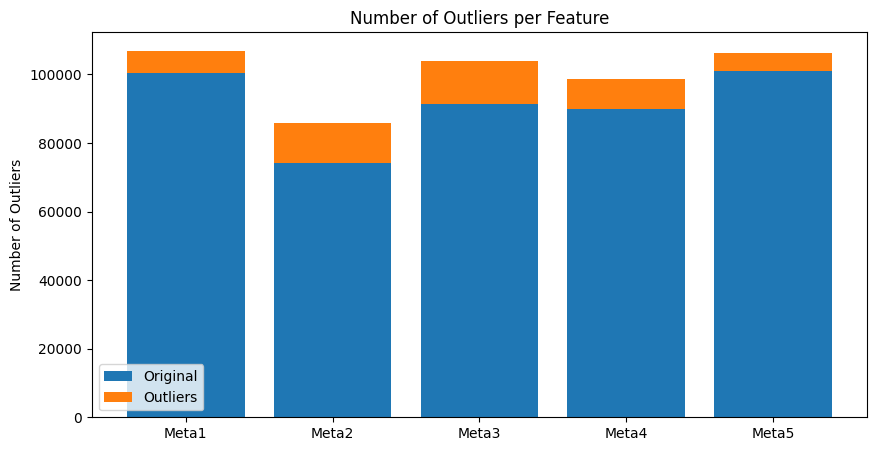

In [8]:
# Stacked bar chart of outliers
original_len = [len(df[col]) - df[col].isnull().sum() for col in outliers]
outlier_len = [len(outliers[col]) for col in outliers]

fig, ax = plt.subplots(figsize=(10, 5))
ax.bar(range(len(outliers)), original_len, label="Original")
ax.bar(range(len(outliers)), outlier_len, bottom=original_len, label="Outliers")
ax.set_xticks(range(len(outliers)))
ax.set_xticklabels(outliers.keys())
ax.set_ylabel("Number of Outliers")
ax.set_title("Number of Outliers per Feature")
ax.legend()
plt.show()

We will use MissForest to impute the missing data. We need to check the distribution of data before and after imputing and keep them as similar as possible

array([[<Axes: title={'center': 'Meta1'}>,
        <Axes: title={'center': 'Meta2'}>],
       [<Axes: title={'center': 'Meta3'}>,
        <Axes: title={'center': 'Meta4'}>],
       [<Axes: title={'center': 'Meta5'}>, <Axes: >]], dtype=object)

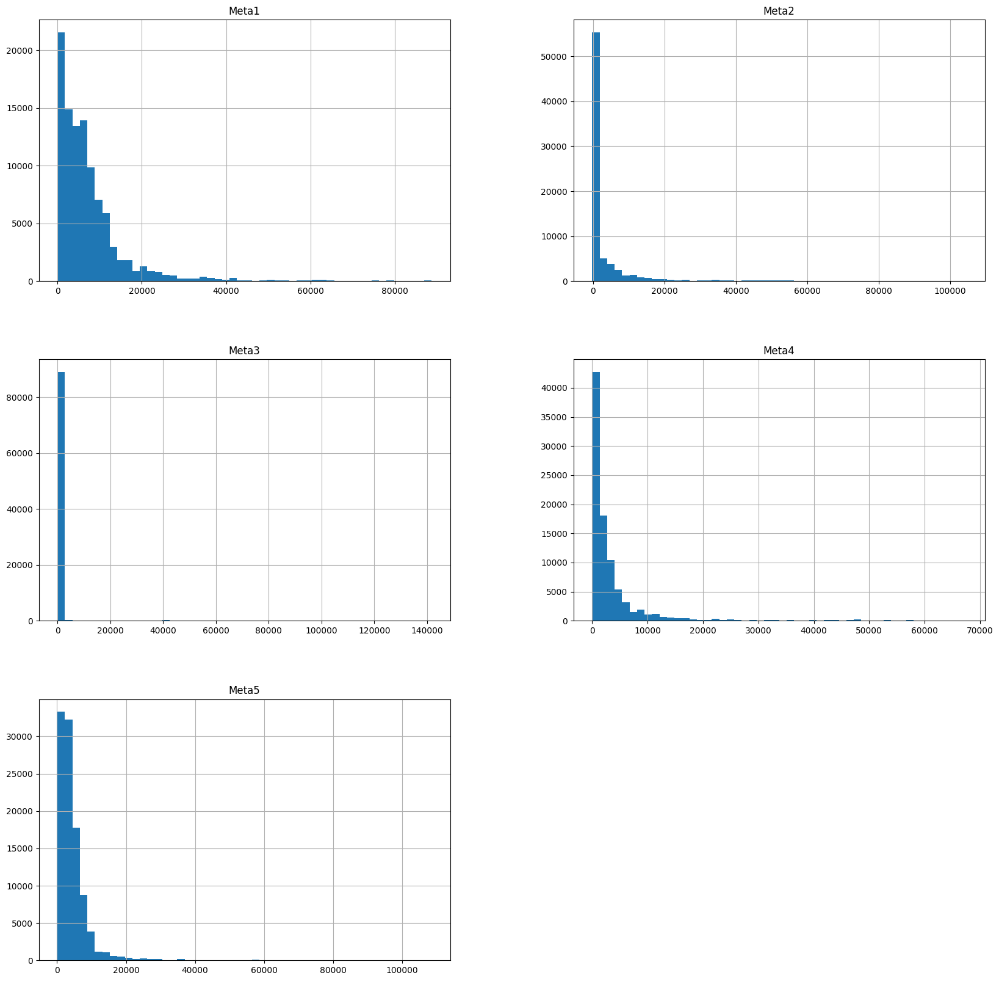

In [9]:
df[cols_with_missing].hist(figsize=(20, 20), bins=50)

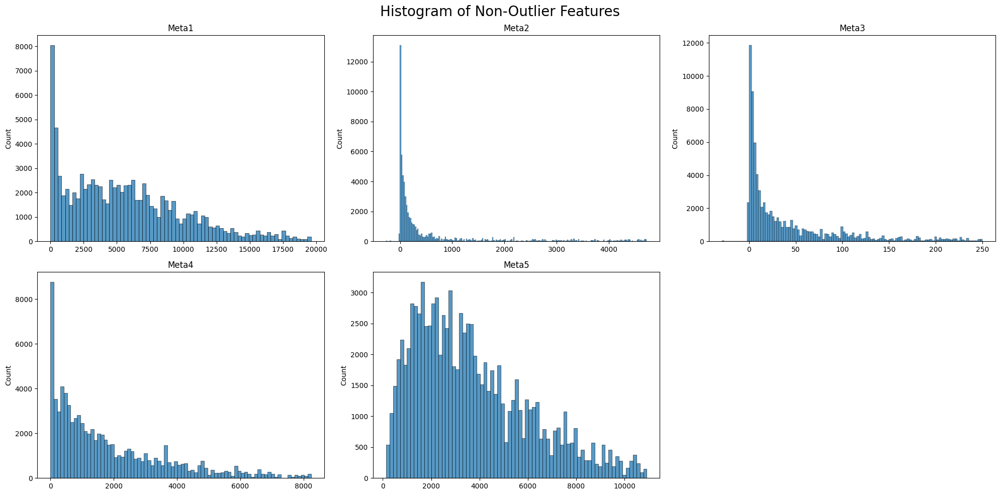

In [10]:
import warnings
warnings.filterwarnings('ignore')

fig = plt.figure(figsize=(20, 10))
for i, col in enumerate(cols_with_missing):
    ax = fig.add_subplot(2, 3, i+1)
    sns.histplot(non_outlier[col], ax=ax)
    ax.set_title(col)

fig.suptitle('Histogram of Non-Outlier Features', fontsize=20)
plt.tight_layout()
plt.show()

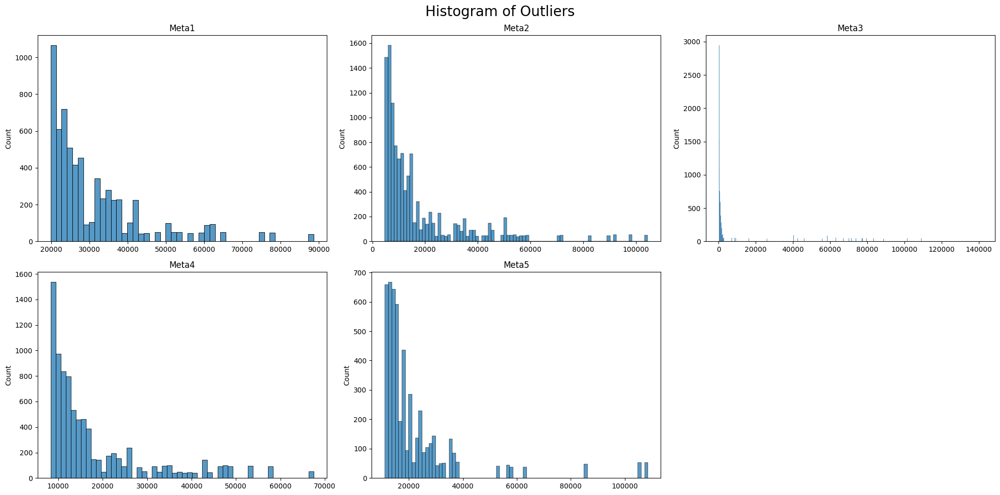

In [11]:
import warnings
warnings.filterwarnings('ignore')

fig = plt.figure(figsize=(20, 10))
for i, col in enumerate(cols_with_missing):
    ax = fig.add_subplot(2, 3, i+1)
    sns.histplot(outliers[col], ax=ax)
    ax.set_title(col)

fig.suptitle('Histogram of Outliers', fontsize=20)
plt.tight_layout()
plt.show()

In [4]:
%%capture
import sklearn.neighbors._base # this is from `scikit-learn` instead of `sklearn`
import sys
sys.modules['sklearn.neighbors.base'] = sklearn.neighbors._base
from missingpy import MissForest 

imputer = MissForest()
df['Numeric_Type'] = df['Type'].map({'A': 0, 'B': 1, 'C': 2})

import warnings
warnings.filterwarnings('ignore')

transformed_data = df[['Store', 'Dept', 'Weekly_Sales', 'IsHoliday', 'Temperature',
       'Fuel_Price', 'Meta1', 'Meta2', 'Meta3', 'Meta4', 'Meta5', 'CPI',
       'Unemployment', 'Numeric_Type', 'Size']].values
transformed_data = imputer.fit_transform(transformed_data)

df[cols_with_missing] = transformed_data[:,6:11]

In [5]:
# identify outliers in these missing columns
outliers = {}
non_outlier = {}
upper = {}
for col in cols_with_missing:
    upper[col] = df[col].quantile(0.75) + 1.5*(df[col].quantile(0.75) - df[col].quantile(0.25))
    outliers[col] = df[col][df[col] > upper[col]].tolist()
    non_outlier[col] = df[col][df[col] <= upper[col]].tolist()

array([[<Axes: title={'center': 'Meta1'}>,
        <Axes: title={'center': 'Meta2'}>],
       [<Axes: title={'center': 'Meta3'}>,
        <Axes: title={'center': 'Meta4'}>],
       [<Axes: title={'center': 'Meta5'}>, <Axes: >]], dtype=object)

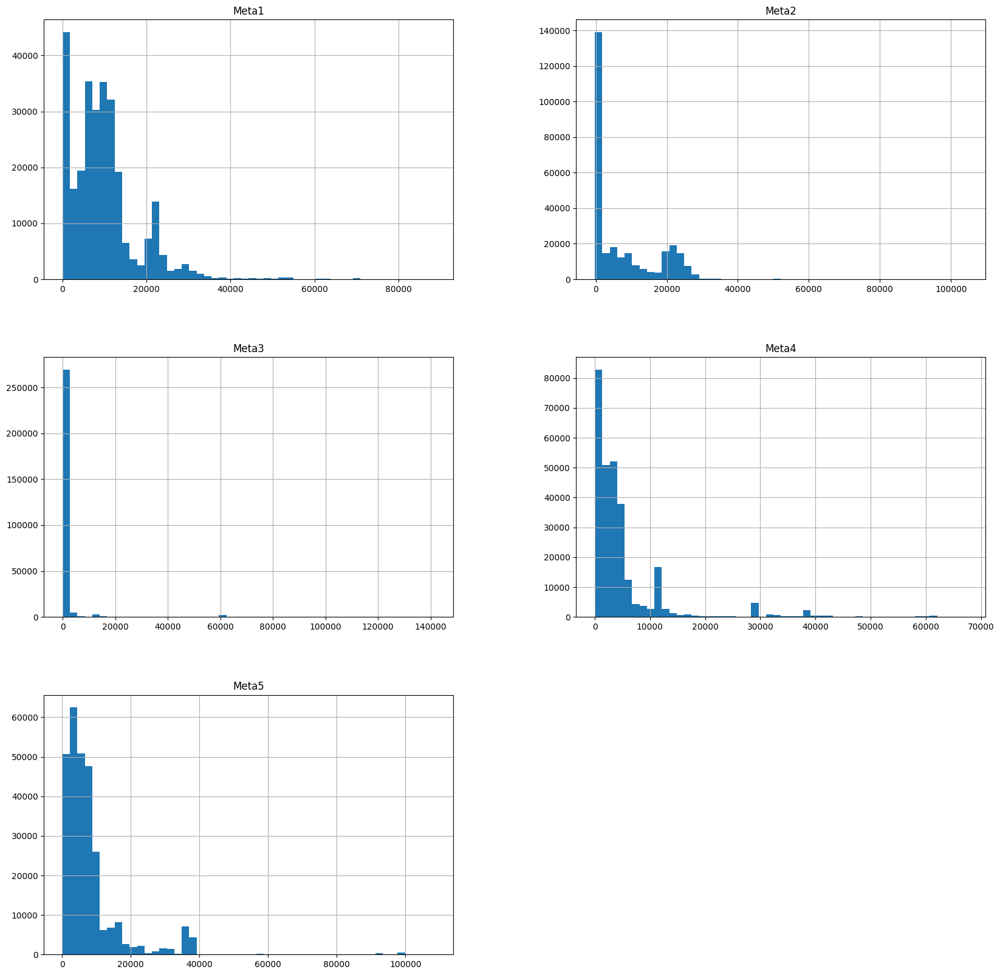

In [6]:
df[cols_with_missing].hist(figsize=(20, 20), bins=50)

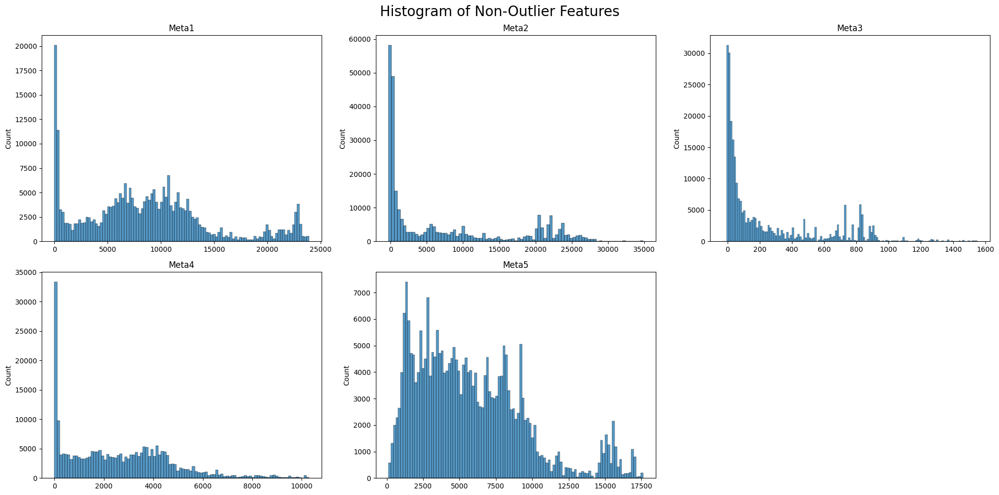

In [7]:
import warnings
warnings.filterwarnings('ignore')

fig = plt.figure(figsize=(20, 10))
for i, col in enumerate(cols_with_missing):
    ax = fig.add_subplot(2, 3, i+1)
    sns.histplot(non_outlier[col], ax=ax)
    ax.set_title(col)

fig.suptitle('Histogram of Non-Outlier Features', fontsize=20)
plt.tight_layout()
plt.show()

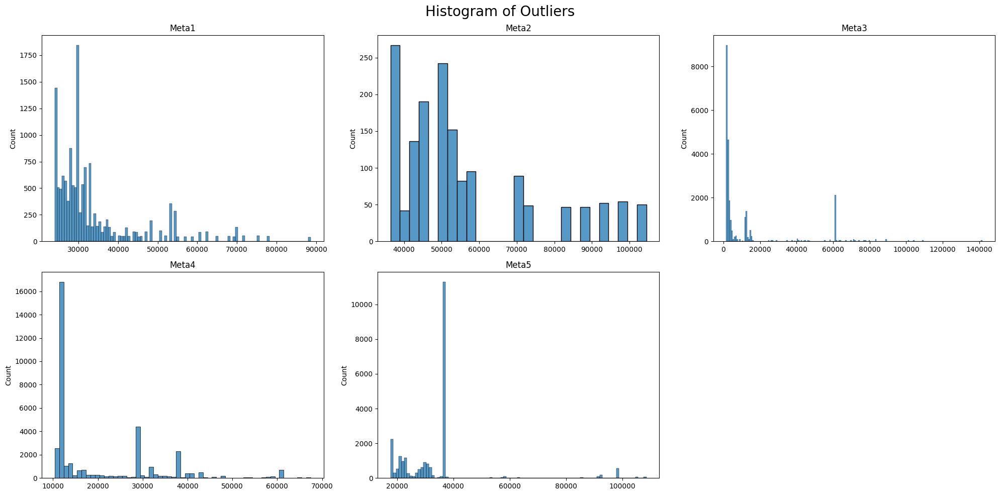

In [8]:
import warnings
warnings.filterwarnings('ignore')

fig = plt.figure(figsize=(20, 10))
for i, col in enumerate(cols_with_missing):
    ax = fig.add_subplot(2, 3, i+1)
    sns.histplot(outliers[col], ax=ax)
    ax.set_title(col)

fig.suptitle('Histogram of Outliers', fontsize=20)
plt.tight_layout()
plt.show()

# Data Transforming

Initially, we must modify the date column and arrange the data based on it.

In [9]:
df['Date'] = pd.to_datetime(df['Date'])
df['Year'] = df['Date'].dt.year
df['Month'] = df['Date'].dt.month
df['Day'] = df['Date'].dt.day

# Sort by date
df = df.sort_values(by='Date')

Now, let's use `seasonal_decompose` to decompose the time series

Note that our time series is identitfied by:
- Store's ID
- Department's ID
- Type

So we should make an interactive dashboard to filter based on these 3 information. When we are building and training the model, each model will be used for each of these time series

## Const vs non-constant seasonal variation

In [62]:
from ipywidgets import interact
from statsmodels.tsa.seasonal import seasonal_decompose
import matplotlib.pyplot as plt

@interact
def plot_sales(store=sorted(df['Store'].unique()), dept=sorted(df['Dept'].unique()), type=df['Type'].unique(), period=(1, 60), model=['additive', 'multiplicative']):
    """Interactively filters and plots weekly sales decomposition for selected store and department."""
    filtered_df = df[(df['Store'] == store) & (df['Dept'] == dept) & (df['Type'] == type)]
    filtered_df = filtered_df[['Date', 'Weekly_Sales']].set_index('Date')
    filtered_df.index = pd.to_datetime(filtered_df.index)
    
    if filtered_df.empty:
        print('No data available for the selected store and department.')
        return
    
    decomposed = seasonal_decompose(filtered_df['Weekly_Sales'], model=model, period=period)

    # plot with time in x axis
    fig = decomposed.plot()
    fig.set_size_inches(15, 12)
    plt.title(f'Weekly Sales Decomposition for Store {store}, Dept {dept}')  # Informative title
    plt.show()


interactive(children=(Dropdown(description='store', options=(1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15…

- Playing various tuples allows us to observe how data fluctuates across different stores, departments, and product types

- Many tuples exhibit distinct trends and seasonality, as seen in the case of store 39, department 13, and product type A, or store 1, department 81, type A

- However, there are also instances where time series data lacks discernible patterns, making them challenging to recognize. As an inference, let's see store 13, dept 81

- Some time series seems to have non constant seasonal variation. In such cases, we should use multiplicative model to decompose them. For reference, let's see Store 12, Dept 13, Type B

## Stationary vs Non stationary

Analyzing the visualization can offer insights into the stationarity of the data. Typically, if the data exhibits a distinct trend and seasonality, it is considered non-stationary. In such instances, additional procedures such as log transformation or differencing may be necessary to make them stationery.

However, it is essential to employ a statistical test to confirm the validity of our observations. As indicated below, the combination of store 1, department 44, and type A appears to be non-stationary, as its p-value exceeds the commonly utilized critical value of 0.01 for Ad-fuller. Although KPSS treats it as stationery, there is still confusion here. Upon implementing differencing, the data transforms into a stationary state and it succeed to pass both tests

Every time we need to apply differencing, the `d` parameter will be larger than 0.

In [21]:
from statsmodels.tsa.stattools import adfuller, kpss
def test_stationarity(timeseries, window = 12, cutoff = 0.01, x_label = 'Date', y_label = 'Weekly_Sales'):
    if (timeseries.empty):
        print('The timeseries is empty')
        return

    # Determing rolling statistics
    rolmean = timeseries[y_label].rolling(window).mean()
    rolstd = timeseries[y_label].rolling(window).std()

    # Plot rolling statistics:
    plt.figure(figsize=(12, 8))
    plt.plot(timeseries[x_label], timeseries['Weekly_Sales'], color='blue',label='Original')
    plt.plot(timeseries[x_label], rolmean, color='red', label='Rolling Mean')
    plt.plot(timeseries[x_label], rolstd, color='black', label = 'Rolling Std')

    plt.legend(loc='best')
    plt.title('Rolling Mean & Standard Deviation')
    plt.show()
    
    #Perform Dickey-Fuller test:
    print('Results of Dickey-Fuller Test:')
    dftest = adfuller(timeseries[y_label], autolag='AIC', maxlag = 20 )
    dfoutput = pd.Series(dftest[0:4], index=['Test Statistic','p-value','#Lags Used','Number of Observations Used'])
    for key,value in dftest[4].items():
        dfoutput['Critical Value (%s)'%key] = value
    pvalue = dftest[1]
    if pvalue < cutoff:
        print('p-value = %.4f. The series is likely stationary.' % pvalue)
    else:
        print('p-value = %.4f. The series is likely non-stationary.' % pvalue)

    print('Result of KPSS test:')
    kpsstest = kpss(timeseries[y_label], regression='c', nlags = "auto")
    kpss_output = pd.Series(kpsstest[0:3], index=['Test Statistic','p-value','Lags Used'])
    for key,value in kpsstest[3].items():
        kpss_output['Critical Value (%s)'%key] = value
    pvalue = kpsstest[1]
    if pvalue > cutoff:
        print('p-value = %.4f. The series is likely stationary.' % pvalue)
    else:
        print('p-value = %.4f. The series is likely non-stationary.' % pvalue)
    
    print(dfoutput)

In [22]:
@interact
def plot_store_dept(store=sorted(df['Store'].unique()), dept=sorted(df['Dept'].unique()), type=df['Type'].unique()):
    test_stationarity(df[(df['Store']==store) & (df['Dept']==dept) & (df['Type']==type)])

interactive(children=(Dropdown(description='store', options=(1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15…

In [10]:
df['Diff_Weekly_Sales'] = df['Weekly_Sales'] - df['Weekly_Sales'].shift(1)

In [24]:
@interact
def plot_store_dept(store=sorted(df['Store'].unique()), dept=sorted(df['Dept'].unique()), type=df['Type'].unique()):
    test_stationarity(df[(df['Store']==store) & (df['Dept']==dept) & (df['Type']==type)], y_label = 'Diff_Weekly_Sales')

interactive(children=(Dropdown(description='store', options=(1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15…

## ACF & PACF

In [25]:
@interact
def plot_acf_pacf(store=sorted(df.Store.unique()), dept=sorted(df.Dept.unique()), type = ['A','B','C']):
    df1 = df[(df.Store == store) & (df.Dept == dept) & (df.Type == type)]
    fig = plt.figure(figsize=(12,8))
    ax1 = fig.add_subplot(211)
    fig = sm.graphics.tsa.plot_acf(df1.Weekly_Sales, lags=40, ax=ax1)
    ax2 = fig.add_subplot(212)
    fig = sm.graphics.tsa.plot_pacf(df1.Weekly_Sales, lags=40, ax=ax2)

interactive(children=(Dropdown(description='store', options=(1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15…

# Model Training

## SARIMA

In [70]:
# Split train and test data
from sklearn.model_selection import train_test_split
train_df, test_df = train_test_split(df, test_size=0.2, shuffle=False)

In [80]:
from sklearn.model_selection import train_test_split
@interact
def plot_data_split(store=df['Store'].unique(), dept=df['Dept'].unique(), type=df['Type'].unique()):
    sub_train_df, sub_test_df = train_test_split(df[(df['Store'] == store) & (df['Dept'] == dept) & (df['Type'] == type)], test_size=0.2, shuffle=False)
    ax = sub_train_df.plot(x='Date', y='Weekly_Sales', style='b-', grid=True)
    ax = sub_test_df.plot(x='Date', y='Weekly_Sales', style='g-', grid=True, ax=ax)
    ax.legend(['train', 'test'])
    ax.set_xlabel("Date")
    ax.set_ylabel("Weekly Sales")
    ax.set_title("Store {} Dept {} Type {}".format(store, dept, type))
    plt.show()

interactive(children=(Dropdown(description='store', options=(20, 14, 12, 41, 28, 29, 39, 23, 31, 42, 40, 13, 3…

In [115]:
class SarimaxOptimizer():
    def __init__(self, store_id = 20, dept_id=85, type='A'):
        super().__init__()
        self.store_id = store_id
        self.dept_id = dept_id
        self.type = type

        self.train_df, self.test_df = train_test_split(df[(df['Store'] == store_id) & (df['Dept'] == dept_id) & (df['Type'] == type)], test_size=0.2, shuffle=False)
        # convert to numpy array
        self.train_data = self.train_df['Weekly_Sales'].values
        self.test_data = self.test_df['Weekly_Sales'].values
        
    def get_objective(self):
        def objective(params):
            try:
                
                model = sm.tsa.SARIMAX(self.train_data, order=params[:3], seasonal_order=params[3:])
                model_fit = model.fit(disp=False)
                aic = model_fit.aic

                forecast = model_fit.get_forecast(steps=len(self.test_data))
                forecast_values = forecast.predicted_mean

                # Evaluate model
                mae = mean_absolute_error(self.test_data, forecast_values)
                mape = mean_absolute_percentage_error(self.test_data, forecast_values)
                mse = mean_squared_error(self.test_data, forecast_values)

                child_run = self.client.create_run(
                    experiment_id=self.n_experiments,
                    tags={
                        "MLFLOW_PARENT_RUN_ID": self.parent_run.info.run_id
                    }
                )
                self.client.log_param(child_run.info.run_id, 'store_id', self.store_id)
                self.client.log_param(child_run.info.run_id, 'd', params[1])
                self.client.log_param(child_run.info.run_id, 'q', params[2])
                self.client.log_param(child_run.info.run_id, 'P', params[3])
                self.client.log_param(child_run.info.run_id, 'D', params[4])
                self.client.log_param(child_run.info.run_id, 'Q', params[5])
                self.client.log_param(child_run.info.run_id, 'm', params[6])

                self.client.log_metric(child_run.info.run_id, 'aic', aic)
                self.client.log_metric(child_run.info.run_id, 'mae', mae)
                self.client.log_metric(child_run.info.run_id, 'mape', mape)
                self.client.log_metric(child_run.info.run_id, 'mse', mse)
                return aic

            except Exception as e:
                print(e)
                return 1e10
            
        return objective
    
    def optimize(self):
        if not Path('mlruns').exists():
            # here set the tracking_uri. If None then http://localhost:5000
            self.client = MlflowClient()
            self.n_experiments=0
        else:
            self.client = MlflowClient()
            n_experiments = len(self.client.search_experiments())
            experiment_name = f'SARIMAX - Store {self.store_id} Dept {self.dept_id} Type {self.type} Experiment {n_experiments}'
            self.n_experiments = self.client.create_experiment(name=experiment_name)

        self.parent_run = self.client.create_run(experiment_id=self.n_experiments)
        objective = self.get_objective()
        space = [
            scope.int(hp.quniform('p', 0, 3, 1)),
            scope.int(hp.quniform('d', 0, 1, 1)),
            scope.int(hp.quniform('q', 0, 3, 1)),
            scope.int(hp.quniform('P', 0, 2, 1)),
            scope.int(hp.quniform('D', 0, 1, 1)),
            scope.int(hp.quniform('Q', 0, 2, 1)),
            scope.int(hp.quniform('m', 2, 12, 1)),
        ]

        trial = Trials()

        best = fmin(objective, space, algo=tpe.suggest, max_evals=5, trials=trial)
        print(best)

        return best
    
    def show_best(self, best):
        model = sm.tsa.SARIMAX(self.train_data, order=[best['p'], best['d'], best['q']], seasonal_order=[best['P'], best['D'], best['Q'], best['m']])
        model_fit = model.fit(disp=False)
        print(model_fit.summary())

        fig = model_fit.plot_diagnostics(figsize=(8, 8))
        fig.autofmt_xdate()
        # plt.show()

        forecast = model_fit.get_forecast(steps=len(self.test_data))
        forecast_values = forecast.predicted_mean
        confidence_intervals = forecast.conf_int()

        # Plot forecast with training data
        fig, ax = plt.subplots(figsize=(12, 6))

        # Plot data points
        ax.plot(self.train_df['Date'], self.train_data, label='observed')

        # Plot predictions
        self.test_df['Forecast'] = forecast_values
        ax.plot(self.test_df['Date'], self.test_df['Forecast'], label='forecast')

        # Plot actual values
        ax.plot(self.test_df['Date'], self.test_data, label='actual')

        # Plot confidence intervals
        ax.fill_between(self.test_df['Date'], confidence_intervals[:, 0], confidence_intervals[:, 1], color='k', alpha=.25)

        # Set axes labels
        ax.set_xlabel('Date')
        ax.set_ylabel('Sales')

        plt.legend()
        plt.show()

        # Evaluate model
        mae = mean_absolute_error(self.test_data, forecast_values)
        print('MAE: %.3f' % mae)
        mape = mean_absolute_percentage_error(self.test_data, forecast_values)
        print('MAPE: %.3f' % mape)
        mse = mean_squared_error(self.test_data, forecast_values)
        print('MSE: %.3f' % mse)

In [116]:
@interact
def sarimaOptimize(store=df['Store'].unique(), dept=df['Dept'].unique(), type=df['Type'].unique()):
    sarimaOpt = SarimaxOptimizer(store, dept, type)
    best = sarimaOpt.optimize()
    sarimaOpt.show_best(best)

interactive(children=(Dropdown(description='store', options=(20, 14, 12, 41, 28, 29, 39, 23, 31, 42, 40, 13, 3…

## XGBOOST

In [11]:
predictor_feature = [ x for x in df.columns.tolist() if x not in ['Date','Numeric_Type', 'Diff_Weekly_Sales', 'Weekly_Sales']]
predictor_feature

['Store',
 'Dept',
 'IsHoliday',
 'Temperature',
 'Fuel_Price',
 'Meta1',
 'Meta2',
 'Meta3',
 'Meta4',
 'Meta5',
 'CPI',
 'Unemployment',
 'Type',
 'Size',
 'Year',
 'Month',
 'Day']

In order to identify the useful features to predict. We use predictive power score

- PPS for numeric feature

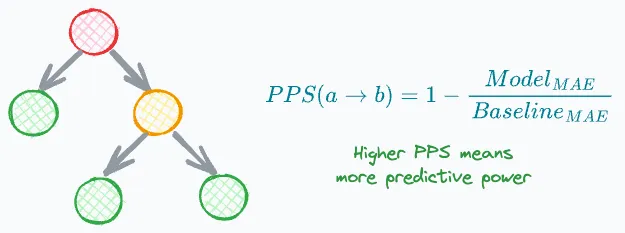

- PPS for categorical feature

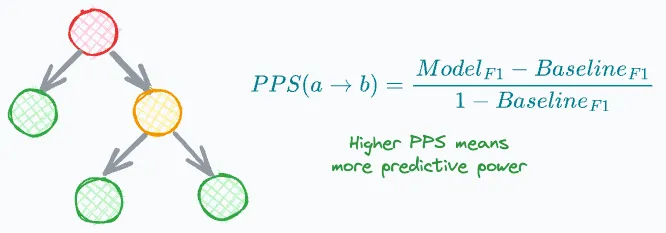

**Note**

The ADRL model enables us to validate the need of lag features (auto correlated feature), determining their significance. Due to limitations in our experimental setup, we lack access to data within the test set. Consequently, we choose to evaluate XGBoost in  scenario: without incorporating the lag feature and the other with it.

In [156]:
from ipywidgets import widgets

feature = widgets.SelectMultiple(
    options = predictor_feature,
    value = predictor_feature,
    description = "Features used for forecasting",
    disable=False
)
feature

SelectMultiple(description='Features used for forecasting', index=(0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 1…

In [163]:
import warnings
warnings.filterwarnings('ignore')

from sklearn import preprocessing
lbl = preprocessing.LabelEncoder()

import ppscore as pps


@interact
def perform_xgb(store = sorted(df["Store"].unique()), 
                  dept = sorted(df["Dept"].unique()), 
                  type=df['Type'].unique()):
    print(f"Feature used for forecasting: {list(feature.value)}")
    def calculate_pps(store, dept, type):
        sub_df = df[(df["Store"] == store) & (df["Dept"] == dept) & (df["Type"] == type)]
        pps_arr = pps.matrix(sub_df[predictor_feature+["Weekly_Sales"]])
        pps_arr = pps_arr[["x","y","ppscore"]].pivot(index="x", columns="y", values="ppscore").fillna("-")
        model = ARDL(df.Weekly_Sales.values, [1,2,3,4,5,6,7,8,9,10,11,12,13,14,15])
        ardl = model.fit()
        print(ardl.summary())
        
        fig = plt.figure(figsize=(20,20))
        sns.heatmap(pps_arr, vmin=0, vmax=1, cmap="Blues", linewidths=0.5, annot=True)
        plt.title(f"Predictive Power Score for Store {store}, Dept {dept}, Type {type}")
        plt.show()

    def train(store, dept, type):
        if not Path('mlruns').exists():
            # here set the tracking_uri. If None then http://localhost:5000
            client = MlflowClient()
            n_experiments=0
        else:
            client = MlflowClient()
            n_experiments = len(client.search_experiments())
            
        mlflow.set_experiment(f"XGBoost - Store {store}, Dept {dept}, Type {type} Experiment {n_experiments}")
        mlflow.xgboost.autolog(silent=True)

        with mlflow.start_run():
            sub_df = df[(df["Store"] == store) & (df["Dept"] == dept) & (df["Type"] == type)]
            sub_df['Type'] = lbl.fit_transform(sub_df['Type'].values)
            sub_train_df, sub_test_df = train_test_split(sub_df, test_size=0.2, shuffle=False)
            data_train = xgb.DMatrix(sub_train_df[list(feature.value)], label=sub_train_df["Weekly_Sales"])
            data_test = xgb.DMatrix(sub_test_df[list(feature.value)], label=sub_test_df["Weekly_Sales"])

            xgb_params = {
                'objective': 'reg:squarederror',
                'colsample_bytree': 0.3,
                'learning_rate': 0.1,
                'max_depth': 5,
                'alpha': 10,
                'n_estimators': 1000,
                'enable_categorical': True,
            }
            model = xgb.train(xgb_params, data_train, evals=[(data_test, "test"), (data_train, "train")], early_stopping_rounds=50, verbose_eval=100)

            prediction = model.predict(data_test)
            fig, ax = plt.subplots(figsize=(12, 6))

            # Plot predictions
            sub_test_df['Forecast'] = prediction
            ax.plot(sub_test_df['Date'], sub_test_df['Forecast'], label='forecast')

            # Plot actual values
            ax.plot(sub_test_df['Date'], sub_test_df['Weekly_Sales'], label='actual')

            # Set axes labels
            ax.set_xlabel('Date')
            ax.set_ylabel('Sales')

            plt.legend()
            plt.show()
            

    calculate_pps(store, dept, type)
    train(store, dept, type)

interactive(children=(Dropdown(description='store', options=(1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15…

- We retain features with high prediction power scores exclusively. Upon executing the cell above with Store 1, Dept 1, and Type A, we observe that only the `Month` feature exhibits a positive PPS. Subsequently, we conduct two tests: one with the complete set of features and another with solely the `Month` feature.

- As expected,  the result with only the `Month` feature surpasses the performance of the first case

- This outcome is specific to Store 1, Dept 1, Type A. For other tuples, a reassessment of the corresponding PPS is necessary to determine the feature selection.

- In this experiment setup, lag features are not employed. However, in an alternative setup where access to comprehensive historical data is available, the inclusion of lag features should be taken into consideration

**All of the logged metrics, params, artifacts, models can be viewed on http://localhost:5000**